## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Step 1: I'll compute the camera calibration using chessboard images

In [405]:
import cv2
import matplotlib.pyplot as plt; import matplotlib.image as mpimg
import numpy as np
import glob; import pickle; import os
from scipy import signal
import scipy as sp

%matplotlib inline

In [2]:
# dimensions of chessboard
nx, ny = 9, 6

# prepare object points (0,0,0), (1,0,0), (2,0,0) .. (8,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[:nx, :ny].T.reshape(-1,2)

# arrays to store object points and image points
objpoints = [] # 3d points in the real world
imgpoints = [] # 2d points in image space 

images = glob.glob('camera_cal/*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # if found, store in objpoints and imagepoints. 
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # draw and display corners
#         img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
#         cv2.imshow('img', img)
#         cv2.waitKey(500)
        
# cv2.destroyAllWindows()

## Step 2: Apply a distortion correction to raw images

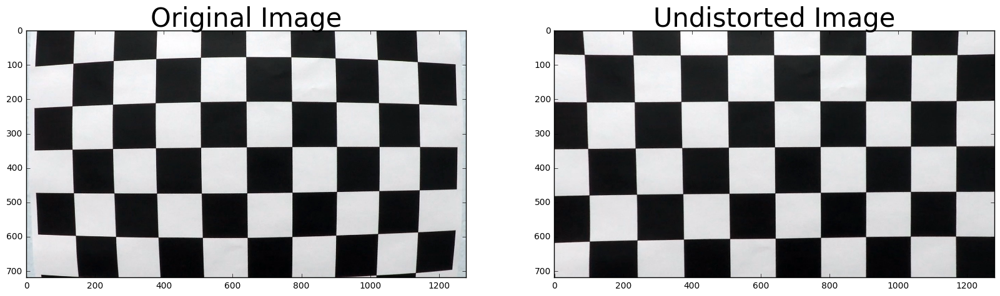

In [14]:
# select a chessboard image exmaple, undistort it
img = cv2.imread(images[0])
img_size = (img.shape[1], img.shape[0])

# compute camera calibration matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/camera_cal_check.jpg', dst)

# plot the example before and after calibration
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize = 30)                                                 

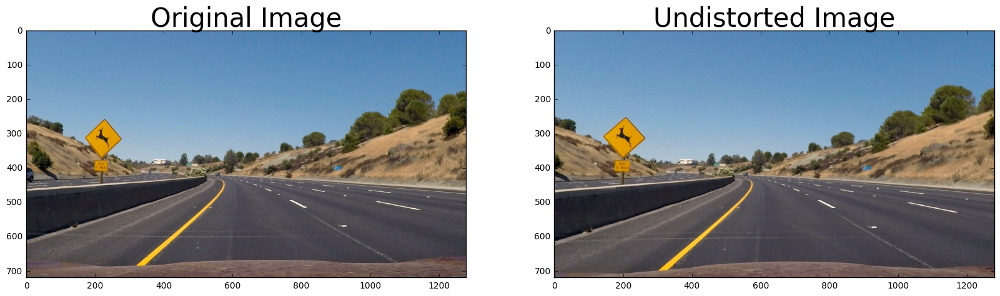

In [5]:
# select a lane example, undistort it
lane_img = cv2.imread('test_images/test2.jpg')
lane_img_size = (lane_img.shape[1], lane_img.shape[0])
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(cv2.cvtColor(lane_img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize = 30)
ax2.imshow(cv2.cvtColor(lane_dst, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize = 30)

In [17]:
# save camera calibration matrix and distortion coefficients
myCalibration = {'mtx': mtx, 'dist': dist}

if not os.path.exists('./output'):
    os.makedirs('./output')

pickle.dump(myCalibration, open("./output/myCalibration.p", "wb"))

myCalibration = pickle.load(open("./output/myCalibration.p", "rb"))

In [18]:
import pickle
myCalibration = pickle.load(open("./output/myCalibration.p", "rb"))

## Step 3: Use color transforms, gradients, etc., to create a thresholded binary image.

In [5]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    '''
    "Taking the gradients in the x-direction emphasizes edges closer to vertical
    and in the y-direction, edges closer to horizontal."
    '''
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output

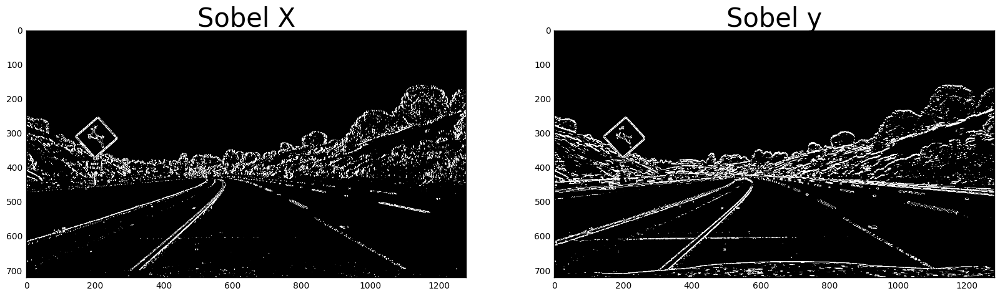

In [146]:
lane_img = mpimg.imread('test_images/test2.jpg')
lane_img_size = (lane_img.shape[1], lane_img.shape[0])
mtx = myCalibration['mtx']
dist = myCalibration['dist']
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)

lane_gradx = abs_sobel_thresh(lane_dst, 'x', 20, 100)
lane_grady = abs_sobel_thresh(lane_dst, 'y', 20, 100)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(lane_gradx, cmap = 'gray')
ax1.set_title('Sobel X', fontsize = 30)
ax2.imshow(lane_grady, cmap = 'gray')
ax2.set_title('Sobel y', fontsize = 30)

In [6]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 6) Create a binary mask where mag thresholds are met
    # 7) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    # mag is a matrix
    mag = np.sqrt(sobelx**2+sobely**2)
    
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    
    binary_output = np.zeros_like(gray)
    binary_output[(scaled_sobel>=mag_thresh[0])&(scaled_sobel<=mag_thresh[1])] = 1
    return binary_output

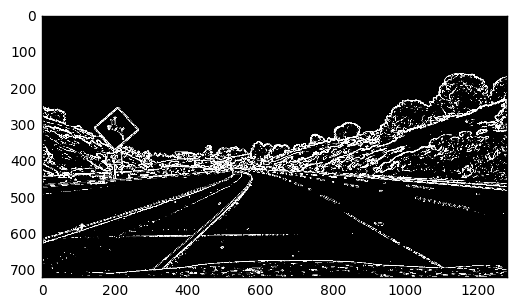

In [148]:
lane_mag_small = mag_thresh(lane_dst, 3, (20, 100))

plt.imshow(lane_mag_small, cmap = 'gray')

In [7]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

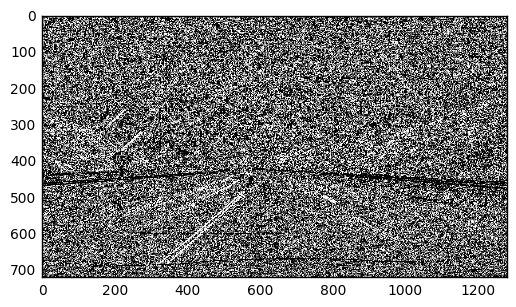

In [150]:
lane_dir = dir_threshold(lane_img, sobel_kernel=3, thresh=(0.7, 1.3))
plt.imshow(lane_dir, cmap = 'gray')

In [8]:
def hls_select(img, thresh=(0, 255)):
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1

    return binary_output

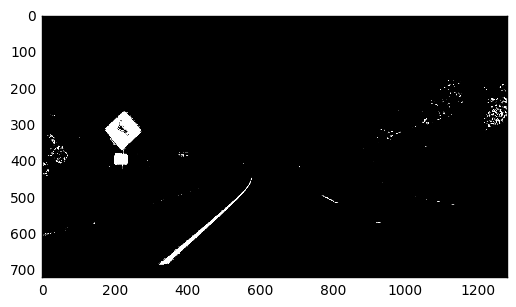

In [153]:
lane_color = hls_select(lane_img, thresh=(170,255))
plt.imshow(lane_color, cmap = 'gray')

In [257]:
def thresholding(img, hls_thresh=(170,255), sobel_kernel=3, 
                 gradx_thresh=(20,100), grady_thresh=(20,100), 
                 mag_thresh=(30,100), dir_thresh=(.7,1.3)):
    # thresh_s=(100, 255), thresh_h=(15, 70), thresh_gray=(190, 255))
    # thresh_s=(30, 100), thresh_gray=(50, 255))
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))#, ksize = sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    
    mag = np.sqrt(abs_sobelx**2+abs_sobely**2)
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    
    scaled_sobel_mag = np.uint8(255*mag/np.max(mag))
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    binary_output = np.zeros_like(scaled_sobel_mag)
    binary_output[(scaled_sobelx >= gradx_thresh[0]) & (scaled_sobelx <= gradx_thresh[1]) |
                  #(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1]) &
                  (s_channel > hls_thresh[0]) & (s_channel <= hls_thresh[1]) &
                  ((img[:,:,0]>180) & (img[:,:,1]>180) & (img[:,:,2]<155))] = 1
    
#     threshold_white = (img[:,:,0] < 200) | (img[:,:,1] < 200) | (img[:,:,2] < 200)
#     hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#     threshold_yellow =  ((hsv[:,:,0] <= 40) & (hsv[:,:,0] >= 20)) & ((hsv[:,:,2] > 150) | (hsv[:,:,1] > 150))
    
    return binary_output

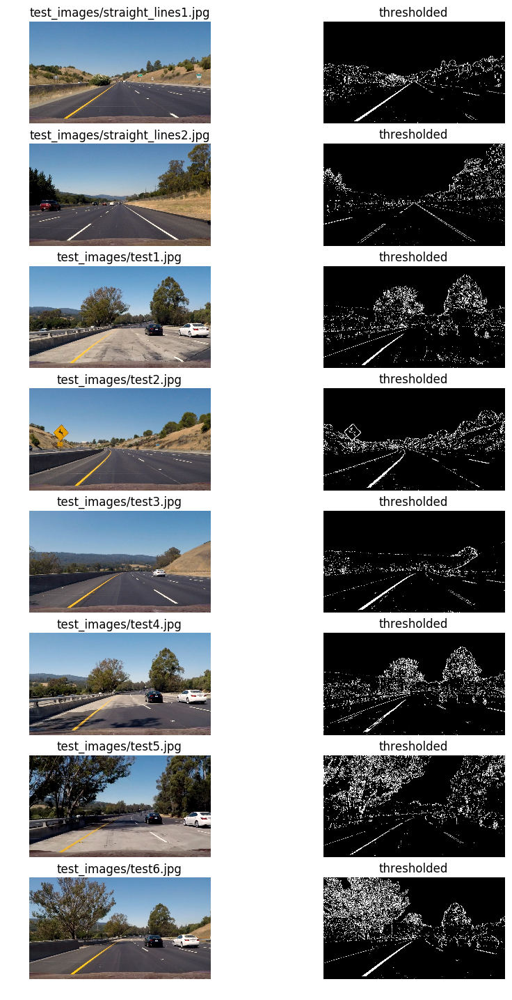

In [258]:
fig = plt.figure()
fig.set_figwidth(10); fig.set_figheight(20)

lane_images = glob.glob('test_images/*.jpg')

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2, title='thresholded')
    lane_img_size = (lane_img.shape[1], lane_img.shape[0])
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    binary = thresholding(lane_dst)
    ax.axis('off')
    ax = plt.imshow(binary, cmap='gray')

## Step 4: Apply a perspective transform to rectify binary image ("birds-eye view")

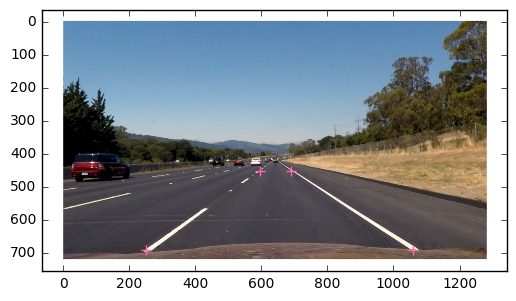

In [20]:
lane_img = mpimg.imread('test_images/straight_lines2.jpg')
lane_img_size = (lane_img.shape[1], lane_img.shape[0])
mtx = myCalibration['mtx']
dist = myCalibration['dist']
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
implot = plt.imshow(lane_dst)
plt.scatter([595,689,1060,250],[450,450,690,690], 
            c='#FF69B4', marker='+', s=50)

In [23]:
def warping(img, w=1280, h=720):
    '''
    These four points were chosen using P1 line slope math. 
    '''
    src = np.float32([[595,450],[689,450],[1060,690],[250,690]])
    dst=np.float32([[w*5/16,0],[w*11/16,0],[w*11/16,h],[w*5/16,h]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

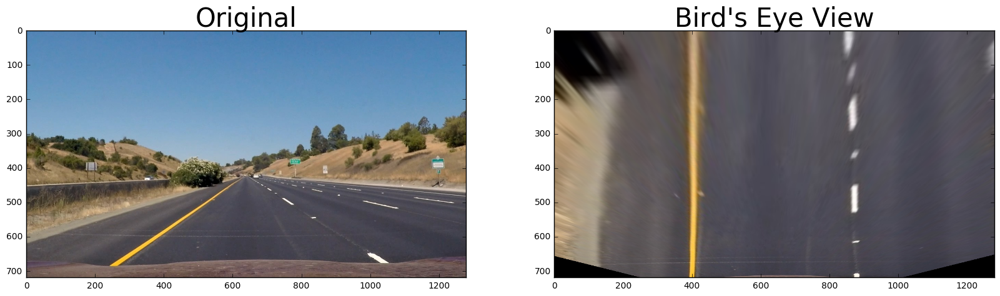

In [24]:
warped, M, Minv = warping(lane_dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(lane_img)
ax1.set_title('Original', fontsize = 30)
ax2.imshow(warped)
ax2.set_title('Bird\'s Eye View', fontsize = 30)

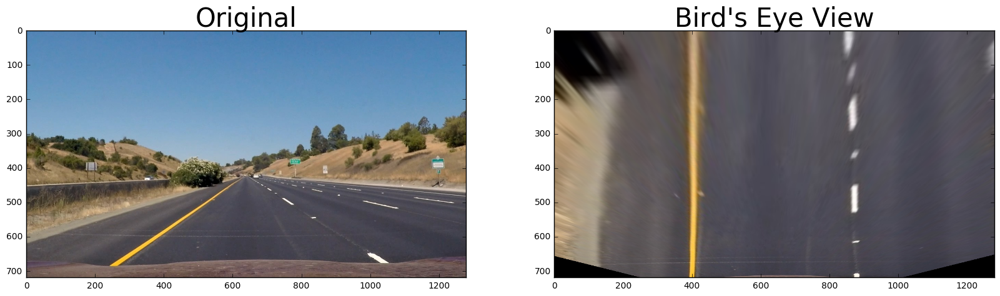

In [185]:
lane_img2 = mpimg.imread('test_images/straight_lines1.jpg')
lane_dst2 = cv2.undistort(lane_img2, mtx, dist, None, mtx)
warped2 = cv2.warpPerspective(lane_dst2, M, (1280,720))

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(lane_img2)
ax1.set_title('Original', fontsize = 30)
ax2.imshow(warped2)
ax2.set_title('Bird\'s Eye View', fontsize = 30)

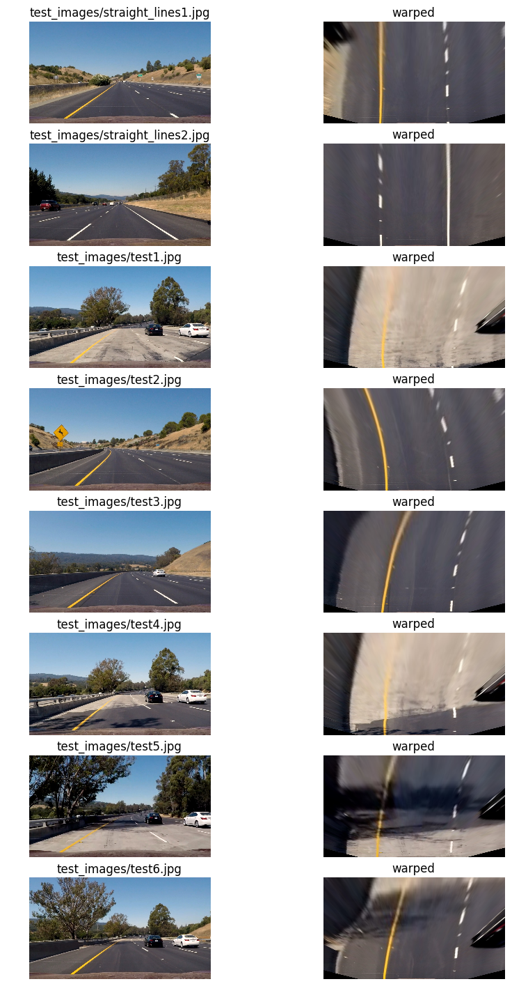

In [186]:
fig = plt.figure()
fig.set_figwidth(10); fig.set_figheight(20)

lane_images = glob.glob('test_images/*.jpg')

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2, title='warped')
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    warped = cv2.warpPerspective(lane_dst, M, (1280,720))
    ax.axis('off')
    ax = plt.imshow(warped)

## Step 5: Detect lane pixels and fit to find lane boundary.

In [187]:
# thresholded and perspective transformed image

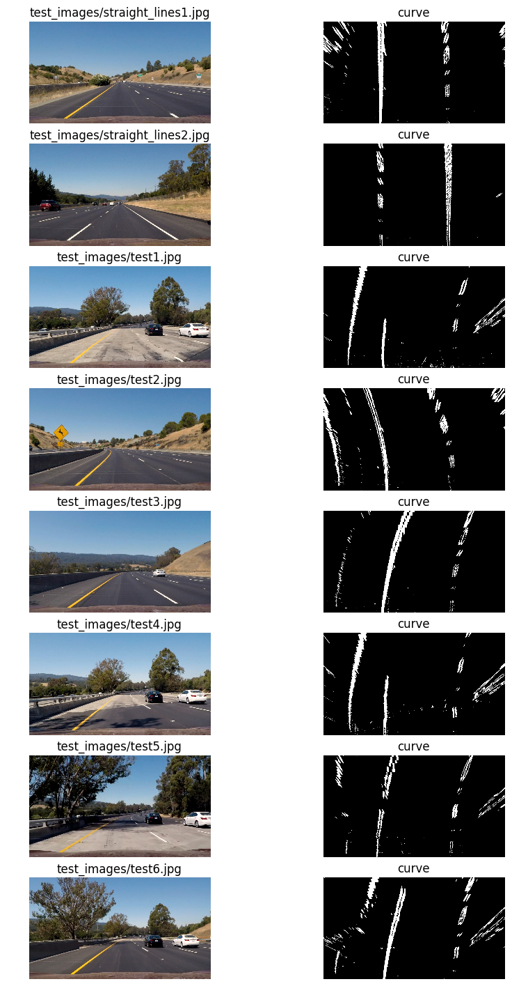

In [259]:
lane_images = glob.glob('test_images/*.jpg')

fig = plt.figure()
fig.set_figwidth(10); fig.set_figheight(20)

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2, title='curve')
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    lane_thresholded = thresholding(lane_dst)
    lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
    ax.axis('off')
    ax = plt.imshow(lane_warped, cmap='gray')

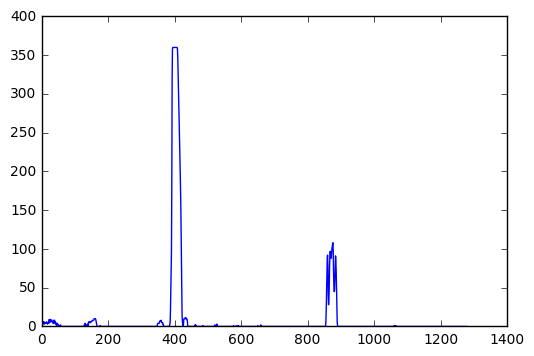

In [195]:
lane_img = mpimg.imread(lane_images[0])
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
lane_thresholded = thresholding(lane_dst)
lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
histogram = np.sum(lane_warped[int(lane_warped.shape[0]/2):, :], axis=0)
plt.plot(histogram)

In [30]:
h,w,c=lane_img.shape

In [263]:
def find_lane_start(histogram):
    mid_left_start = np.argmax(histogram[:int(w/2)])
    mid_right_start = np.argmax(histogram[int(w/2):])+int(w/2)
    return mid_left_start, mid_right_start

def sliding_window_method(warped, δh=64, δv=72):
    
    histogram = np.sum(warped[int(warped.shape[0]/2):, :], axis=0)
    
    mlx0, mrx0 = find_lane_start(histogram)
    mlx, mrx = find_lane_start(histogram)
    y = warped.shape[0]
    lane_pts = np.zeros_like(warped)
    lane_boxes = np.zeros_like(warped)

    while y > 0:

        bbox_left = warped[(y-δv):y, np.clip((mlx-δh),0,1280):(mlx+δh)]
        bbox_right = warped[(y-δv):y, (mrx-δh):np.clip((mrx+δh),0,1280)]
        
        lane_pts[(y-δv):y, (mlx-δh):(mlx+δh)][(bbox_left==1)] = 1
        lane_pts[(y-δv):y, (mrx-δh):(mrx+δh)][(bbox_right==1)] = 1
        lane_boxes[(y-δv):y, np.clip((mlx-δh),0,1280):(mlx+δh)] = 1
        lane_boxes[(y-δv):y, (mrx-δh):np.clip((mrx+δh),0,1280)] = 1
        
        histogram_left = np.sum(bbox_left, axis=0)
        histogram_right = np.sum(bbox_right, axis=0)
        
        peakind_left = signal.find_peaks_cwt(histogram_left, np.arange(10,30))
        peakind_right = signal.find_peaks_cwt(histogram_right, np.arange(10,30))
        
#         print(peakind_left, peakind_right)
        
        if len(peakind_left)>0:
            mlx = int(np.clip(peakind_left[0]+mlx-δh/2,0,w/2))
#             print(mlx)
        if len(peakind_right)>0:
            mrx = int(np.clip(peakind_right[0]+mrx-δh/2,w/2,w))
#             print(mrx)
    
#         if np.argmax(histogram_left)>0:
#             print(np.argmax(histogram_left))
#             mlx = np.argmax(histogram_left)+(mlx-δh)
#         if np.argmax(histogram_right)>0:
#             print(np.argmax(histogram_right))
#             mrx = np.argmax(histogram_right)+(mrx-δh)
        
        y -= δv
        
    return lane_pts, mlx0, mrx0, mlx, mrx

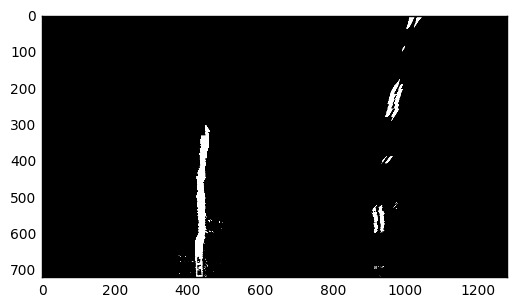

In [264]:
lane_img = mpimg.imread(lane_images[5])
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
lane_thresholded = thresholding(lane_dst)
lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))

x = sliding_window_method(lane_warped)
plt.imshow(x*255, cmap='gray')

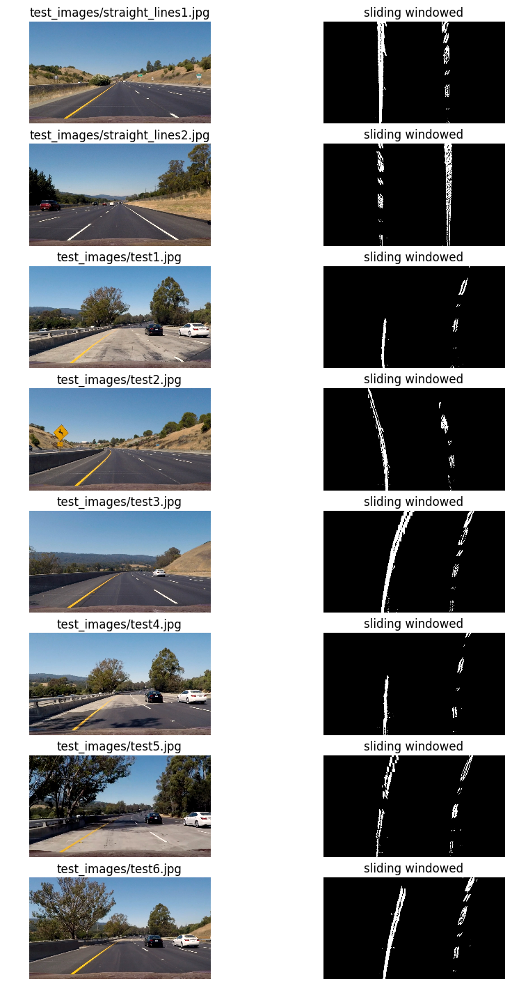

In [265]:
lane_images = glob.glob('test_images/*.jpg')

fig = plt.figure()
fig.set_figwidth(10); fig.set_figheight(20)

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2, title='sliding windowed')
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    lane_thresholded = thresholding(lane_dst)
    lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
    lane_slidingwindowed = sliding_window_method(lane_warped)
    ax.axis('off')
    ax = plt.imshow(lane_slidingwindowed, cmap='gray')

## Step 6: Determine the curvature of the lane and vehicle position with respect to center.

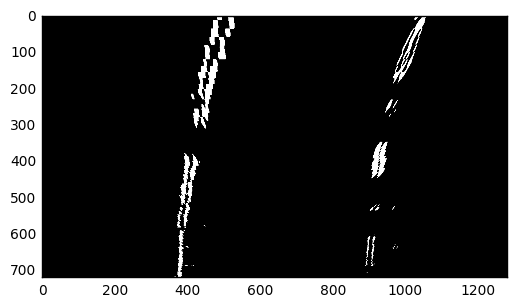

In [717]:
lane_img = mpimg.imread(lane_images[6])
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
lane_thresholded = thresholding(lane_dst)
lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))

x = sliding_window_method(lane_warped)
plt.imshow(x*255, cmap='gray')

In [718]:
lane_dots = x*255

In [719]:
np.where(lane_dots==255)

(array([  0,   0,   0, ..., 719, 719, 719]), array([480, 481, 482, ..., 381, 382, 383]))

In [720]:
xvals = np.where(lane_dots==255)[1]
yvals = np.where(lane_dots==255)[0]

In [721]:
leftx,lefty = xvals[xvals<=w/2],yvals[xvals<=w/2]
rightx,righty = xvals[xvals>w/2],yvals[xvals>w/2]

In [722]:
print(leftx)
print(lefty)
print(rightx)
print(righty)

[480 481 482 ..., 381 382 383]
[  0   0   0 ..., 719 719 719]
[1026 1027 1028 ...,  894  891  903]
[  0   0   0 ..., 707 708 708]


In [723]:
y_arr = np.linspace(0,h,num=h+1)

In [724]:
left_fit = np.polyfit(lefty, leftx, 2)
left_fitx = left_fit[0]*y_arr**2+left_fit[1]*y_arr+left_fit[2]

right_fit = np.polyfit(righty, rightx, 2)
right_fitx = right_fit[0]*y_arr**2+right_fit[1]*y_arr+right_fit[2]

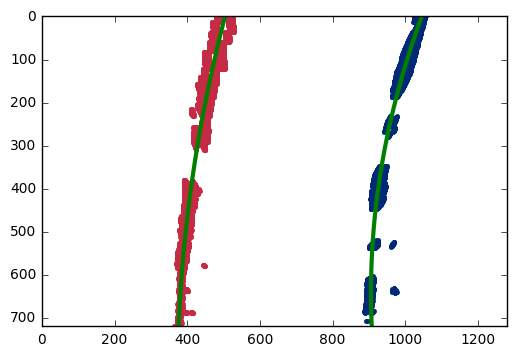

In [725]:
plt.plot(leftx, lefty, '.', color='#C62B46')
plt.plot(rightx, righty, '.', color='#002977')
plt.xlim(0,w)
plt.ylim(0,h)
plt.plot(left_fitx, y_arr, color='green', linewidth=3)
plt.plot(right_fitx, y_arr, color='green', linewidth=3)
plt.gca().invert_yaxis()

In [726]:
print(left_fit)
print(right_fit)

[  1.79218368e-04  -3.06178109e-01   5.03879560e+02]
[  3.39965196e-04  -4.35820198e-01   1.04545826e+03]


In [727]:
lefty_max, righty_max = np.max(lefty), np.max(righty)
left_curved = ((1+(2*left_fit[0]*lefty_max+left_fit[1])**2)**1.5)/np.absolute(2*left_fit[0])
right_curved = ((1+(2*right_fit[0]*righty_max+right_fit[1])**2)**1.5)/np.absolute(2*right_fit[0])
print(left_curved, 'm', right_curved, 'm')

2799.72678478 m 1475.32252811 m


In [728]:
ym_per_pix = 30/h
xm_per_pix = 3.7/(w*(6/16))

left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

lefty_max, righty_max = np.max(lefty*ym_per_pix), np.max(righty*ym_per_pix)

left_curverad = ((1+(2*left_fit_cr[0]*lefty_max+left_fit_cr[1])**2)**1.5)/np.absolute(2*left_fit_cr[0])
right_curverad = ((1+(2*right_fit_cr[0]*righty_max+right_fit_cr[1])**2)**1.5)/np.absolute(2*right_fit_cr[0])
print(left_curverad, 'm', right_curverad, 'm')

# "There's no need to worry about absolute accuracy in this case, 
# but your results should be "order of magnitude" correct. 

628.429953447 m 331.282789812 m


522.70388802
541.578698557
515.439668279


(array([ 255.,  106.,   81.,   68.,   60.,   55.,   30.,   23.,   22.,   21.]), array([ 515.43966828,  518.05357131,  520.66747433,  523.28137736,
        525.89528039,  528.50918342,  531.12308645,  533.73698947,
        536.3508925 ,  538.96479553,  541.57869856]), <a list of 10 Patch objects>)

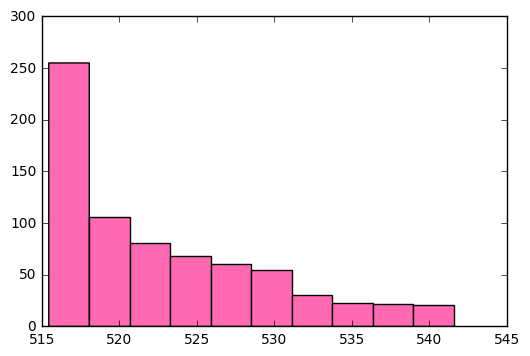

In [729]:
print(np.mean(right_fitx-left_fitx))
print(np.max(right_fitx-left_fitx))
print(np.min((right_fitx-left_fitx)))
plt.hist((right_fitx-left_fitx), color='#FF69B4')

In [660]:
def calcR2(x, y, coeff):

    p = np.poly1d(coeff)
    
    yhat = p(x)
    ybar = np.mean(y)
    ssreg = np.sum((yhat-ybar)**2)
    sstot = np.sum((y - ybar)**2)
    
    return 1.-ssreg / sstot

In [661]:
print(calcR2(lefty, leftx, left_fit))
print(calcR2(righty, rightx, right_fit))

0.764407602874
0.094934013681


In [656]:
def findingCurvature(lane_slidingwindowed):
    xvals = np.where(lane_slidingwindowed==1)[1]
    yvals = np.where(lane_slidingwindowed==1)[0]
    y_arr = np.linspace(0,h,num=h+1)
    
    leftx,lefty = xvals[xvals<=w/2],yvals[xvals<=w/2]
    rightx,righty = xvals[xvals>=w/2],yvals[xvals>=w/2]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*y_arr**2+left_fit[1]*y_arr+left_fit[2]

    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*y_arr**2+right_fit[1]*y_arr+right_fit[2]

    ym_per_pix = 30/h
    xm_per_pix = 3.7/(w*(6/16))

    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    lefty_max, righty_max = np.max(lefty*ym_per_pix), np.max(righty*ym_per_pix)

    left_curverad = ((1+(2*left_fit_cr[0]*lefty_max+left_fit_cr[1])**2)**1.5)/np.absolute(2*left_fit_cr[0])
    right_curverad = ((1+(2*right_fit_cr[0]*righty_max+right_fit_cr[1])**2)**1.5)/np.absolute(2*right_fit_cr[0])
    
    l_fit_r2 = calcR2(lefty, leftx, left_fit)
    r_fit_r2 = calcR2(righty, rightx, right_fit)
    
    
    return leftx, lefty, rightx, righty, left_fitx, right_fitx, left_curverad, right_curverad, l_fit_r2, r_fit_r2

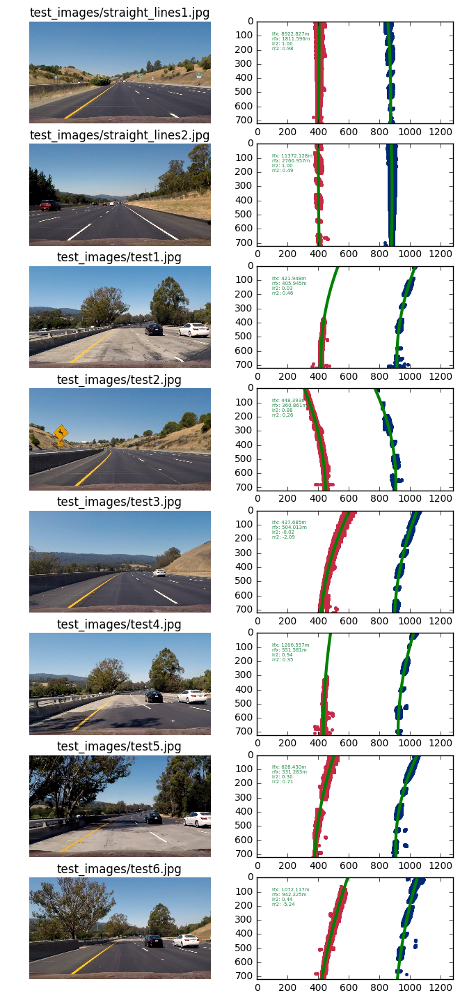

In [657]:
lane_images = glob.glob('test_images/*.jpg')

fig = plt.figure()
fig.set_figwidth(8); fig.set_figheight(20)

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2)
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    lane_thresholded = thresholding(lane_dst)
    lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
    lane_slidingwindowed = sliding_window_method(lane_warped)
    
    y_arr = np.linspace(0,h,num=h+1)
    lx,ly,rx,ry,lfx,rfx,lc,rc,lr2,rr2 = findingCurvature(lane_slidingwindowed)
    
    ax.plot(lx, ly, '.', color='#C62B46')
    ax.plot(rx, ry, '.', color='#002977')
    ax.set_xlim(0,w)
    ax.set_ylim(0,h)
    ax.plot(lfx, y_arr, color='green', linewidth=3)
    ax.plot(rfx, y_arr, color='green', linewidth=3)
    ax.text(100, 200, 'lfx: {:.3f}m\nrfx: {:.3f}m\nlr2: {:.2f}\nrr2: {:.2f}'.format(lc,rc,lr2,rr2),
        #verticalalignment='top', horizontalalignment='right',
        #transform=ax.transAxes,
        color='#188440', fontsize=5)

    fig.gca().invert_yaxis()

## Step 7: Warp the detected lane boundaries back onto the original image.

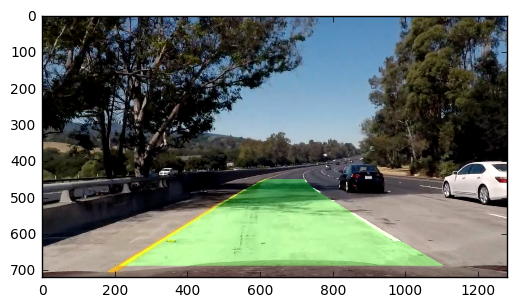

In [685]:
lane_img = mpimg.imread(lane_images[6])
lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
lane_thresholded = thresholding(lane_dst)
lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
lane_slidingwindowed = sliding_window_method(lane_warped)

y_arr = np.linspace(0,h,num=h+1)
lx,ly,rx,ry,lfx,rfx,lc,rc,lr2,rr2 = findingCurvature(lane_slidingwindowed)

warp_zero = np.zeros_like(lane_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

pts_left = np.array([np.transpose(np.vstack([lfx,y_arr]))])
pts_right = np.array([np.transpose(np.vstack([rfx[::-1],y_arr[::-1]]))])
pts = np.hstack((pts_left, pts_right))
cv2.fillPoly(color_warp, np.int_([pts]),(0,255,0))

lane_unwarped = cv2.warpPerspective(color_warp, Minv, (w,h))
result = cv2.addWeighted(lane_dst,1,lane_unwarped,0.3,0)
plt.imshow(result)

## Step 8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

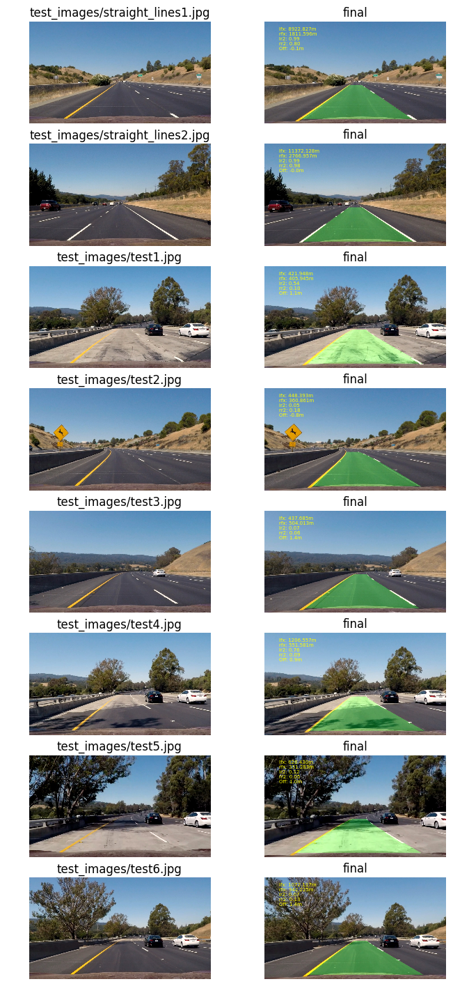

In [701]:
lane_images = glob.glob('test_images/*.jpg')

fig = plt.figure()
fig.set_figwidth(8); fig.set_figheight(20)

for n, i in enumerate(lane_images): 
    ax = fig.add_subplot(9,2,2*n+1, title=i)
    ax.axis('off')
    lane_img = mpimg.imread(i)
    ax = plt.imshow(lane_img)
    
    ax = fig.add_subplot(9,2,2*n+2, title='final')
    ax.axis('off')
    lane_dst = cv2.undistort(lane_img, mtx, dist, None, mtx)
    lane_thresholded = thresholding(lane_dst)
    lane_warped = cv2.warpPerspective(lane_thresholded, M, (1280,720))
    lane_slidingwindowed = sliding_window_method(lane_warped)
    
    y_arr = np.linspace(0,h,num=h+1)
    lx,ly,rx,ry,lfx,rfx,lc,rc,lr2,rr2 = findingCurvature(lane_slidingwindowed)
    offcenter = ((rfx[0]+lfx[0])/2-w/2)*3.7/(w*(6/16))
    
    warp_zero = np.zeros_like(lane_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([lfx,y_arr]))])
    pts_right = np.array([np.transpose(np.vstack([rfx[::-1],y_arr[::-1]]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]),(0,255,0))

    lane_unwarped = cv2.warpPerspective(color_warp, Minv, (w,h))
    result = cv2.addWeighted(lane_dst,1,lane_unwarped,0.3,0)
    
    ax.text(100, 200, 
            'lfx: {:.3f}m\nrfx: {:.3f}m\nlr2: {:.2f}\nrr2: {:.2f}\nOff: {:.1f}m'.format(lc,rc,lr2,rr2,offcenter),
            color='yellow', fontsize=5)
    
    plt.imshow(result)

## Step Extra: Testing on Video

In [704]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [705]:
def process_image(image):
    return image

In [707]:
project_video_output_fname = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_video_output = clip1.fl_image(process_image)
%time project_video_output.write_videofile(project_video_output_fname, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [00:21<00:00, 59.43it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1.88 s, sys: 1.86 s, total: 3.74 s
Wall time: 21.9 s


In [709]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output_fname))